# SHAP & Neural Machine Translation
In this Jupyter Notebook we will look at SHAP as applied to this project's Neural Machine Translation (NMT) model.

#### Sequence-to-Sequence Problems
The SHAP approach was designed to be adaptable to different data types and agnostic to the model used. In our case, we are however looking at a sequence-to-sequence problem which is relatively unusual in terms of SHAP use cases. Sequence-to-sequence problems can be question answering, machine translation, or other problems in which one sequence (generally words) is converted to another.

This notebook serves as confirmation that some SHAP can be easily applied to machine translation problems. The objective is to analyse whether the given words in our output (German) can be 'explained' by particular words or groups of words in our input (English).

## SHAP: Explainer Object & Algorithms
An <b>Explainer</b> object is precisely what it sounds like, it extracts <i>explainability</i> or <i>interpretability</i> from the output of our model given a particular input using a Shapley-based method. There are many algorithms which can be used to estimate the Shapley values that are each deviations from one another. 

#### What is a 'masker'?
When computing Shapley values, we wish to know the effect on the output of taking out certain features / tokens from the input. For this, we can 'mask' the input using a binary array with a length equal to the number of tokens in our input. For instance:

Input = ["This", "is", "an", "example"]<br>
Masker = [0,1,1,1]<br>
Apply mask: ["", "is", "an", "example]<br>

Without the mask, our output would be: "Das ist ein Beispiel". With the mask however, our output becomes "ist ein Beispiel". This indicates to us that the "This" is most responsible for the "Das" in the result. In this case, this is pretty clear as they are in the same position in the sentence. However, in many cases these words will occur in different positions and getting a computer to recognise the links between input-output tokens becomes much more difficult.

#### The Available Algorithms for the Explainer Class
In the SHAP documentation, one can find 8 different algorithms referenced. These are listed as permutation, partition, tree, kernel, sampling, linear, deep and gradient. However, upon inspection of the code in SHAP's Github repository, it appears the a few of these options are no longer possible and a few alternatives are in place. Therefore, here are the parameter options which <i>actually</i> result in a different method being used:
* exact
* permutation
* partition
* tree
* additive
* linear

The choice of algorithm depends on the type of task or data you're working with.

Some are designed for numerical data, and hence issues arise when one attempts to use them on text based data. Let's test each on some basic input sentences and see which methods return an error and which are successful off-the-bat.

In [1]:
from model.nmt import NMTModel
from ipywidgets import FloatProgress
import shap
import shap.plots

#Create an instance of the translation model
model = NMTModel('en','de')
simple_example = ["My name is Daniel Gallagher."]
shap_algorithms = ["exact", "permutation", "partition", "tree", "additive", "linear"]

print("Question: Which algorithm(s) run off-the-bat?")
for algorithm in shap_algorithms:
    try:
        print("\n--Testing '{}' Algorithm--".format(algorithm))
        
        explainer = shap.Explainer(model=model.get(), \
                              masker=model.get_tokenizer(),
                              algorithm=algorithm)
        shap_values = explainer(simple_example)
    except:
        print("Failure: Error occurred for {} algorithm.".format(algorithm))
    else:
        print("Success: No error occurred for {} algorithm.".format(algorithm))

Question: Which algorithm(s) run off-the-bat?

--Testing 'exact' Algorithm--
Failure: Error occurred for exact algorithm.

--Testing 'permutation' Algorithm--


Permutation explainer: 2it [00:23, 23.44s/it]                                              


Success: No error occurred for permutation algorithm.

--Testing 'partition' Algorithm--
Success: No error occurred for partition algorithm.

--Testing 'tree' Algorithm--
Failure: Error occurred for tree algorithm.

--Testing 'additive' Algorithm--
Failure: Error occurred for additive algorithm.

--Testing 'linear' Algorithm--
Failure: Error occurred for linear algorithm.


We can see that two algorithms run off-the-bat: 'permutation' and 'partition'.

## SHAP: Permutation Algorithm
The SHAP documentation has the following to say on the permutation algorithm:
>This is a model agnostic explainer that gurantees local accuracy (additivity) by iterating completely through an entire permutatation of the features in both forward and reverse directions (antithetic sampling). If we do this once, then we get the exact SHAP values for models with up to second order interaction effects. We can iterate this many times over many random permutations to get better SHAP value estimates for models with higher order interactions. This sequential ordering formulation also allows for easy reuse of model evaluations and the ability to effciently avoid evaluating the model when the background values for a feature are the same as the current input value. This method iterates through the permutations of our text input finding the Shapley value at each step, where a 'permutation' of a sentence can be interpreted as any way in which the words can be moved around in the sentence.

We can see that this algorithm represents the SHAP algorithm from the original SHAP paper by Scott Lundberg. There are multiple interesting tidbits to note.<br>

#### Permutation-based, duhh
It is purely permutation-based in finding Shapley values. The above guarantee can only be made due to the iterating through permutations of tokens in both forward and reverse directions.

#### Local Accuracy
It guarantees local accuracy, that is, accuracy for this particular input. This is known as the 'additivity' axiom for the SHAP approach.

#### N-Order Interaction
This gives us the exact SHAP values up to second-order interaction effects, that is, the relationship of two tokens on a third. A SHAP representation which achieves representation for higher-order interaction incorporates all lower-order interactions within it and hence is more generally applicable.

For instance, take the below translations:<br>
"The famous <b>actor</b>": "<b>Der</b> berühmt<b>e</b> Schauspieler"<br>
"The famous <b>actors</b>": "<b>Die</b> berühmt<b>en</b> Schauspieler"

The change of "actor" to plural has had an effect on "Der" and "berühmte", showing a three way interaction between the tokens. Higher-order interactions can be modelled by iterating this forward and reversing of tokens over many random permutations of the input.

## An Example
The below example will use three example sentences chosen based on their effect on word order from English to German. For example, the use of 'weil' and 'dass' pushes the verb to the end of the sentence. A plot is generated using the built-in plotting functionality from the SHAP library.

In [2]:
test_sentences = [["Is it okay that we wanted to go to the shop?"], \
                  ["On Wednesdays I run because I like the feel of it."], \
                  ["It's a pity that I couldn't have cycled with them."] ]

exp_permutation = shap.Explainer(
        model=model.get(), \
        masker=model.get_tokenizer(),
        algorithm="permutation")

for i, sentence in enumerate(test_sentences):
    print("--Test {}--".format(i+1))
    print("Input: ", sentence)
    values_permutation = exp_permutation(sentence)
    shap.plots.text(values_permutation)

--Test 1--
Input:  ['Is it okay that we wanted to go to the shop?']


Permutation explainer: 2it [00:24, 24.74s/it]                                              


--Test 2--
Input:  ['On Wednesdays I run because I like the feel of it.']


Permutation explainer: 2it [00:25, 25.94s/it]                                              


--Test 3--
Input:  ["It's a pity that I couldn't have cycled with them."]


Permutation explainer: 2it [00:26, 26.10s/it]                                              


## SHAP: Partition Algorithm
The SHAP documentation has the following to say on the partition algorithm:
> Partition SHAP computes Shapley values recursively through a hierarchy of features, this hierarchy defines feature coalitions and results in the Owen values from game theory. The PartitionExplainer has two particularly nice properties: 1) PartitionExplainer is model-agnostic but when using a balanced partition tree only has quadradic exact runtime (in term of the number of input features). This is in contrast to the exponential exact runtime of KernalExplainer or SamplingExplainer. 2) PartitionExplainer always assigns to groups of correlated features the credit that set of features would have had if treated as a group. This means if the hierarchical clustering given to PartitionExplainer groups correlated features together, then feature correlations are "accounted for" ... in the sense that the total credit assigned to a group of tightly dependent features does not depend on how they behave if their correlation structure was broken during the explanation's perterbation process. Note that for linear models the Owen values that PartitionExplainer returns are the same as the standard non-hierarchical Shapley values.

#### Correlated Features in Machine Translation
The fact that the partition algorithm takes into account the correlations between groups of features is a prime advantage of this algorithm for use on text data, and with that machine translation. The words in a sentence have strong correlations between themselves and often (as with the German case system) have a direct impact on each other.

How does this compare to permutation SHAP? A great excerpt from [the docs](https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/partition_explainer/Partition.html) explains this well:
> By default the shap.Explainer interface uses the Parition explainer algorithm only for text and image data, for tabular data the default is to use the Exact or Permutation explainers (depending on how many input features are present). The reason the permutation explainer is preferred over the Partition explainer for tabular data is that the partition explainer algorithm will often leave credit on internal nodes of the hierarchical clustering tree. This works well for text and image data where allocating credit to a contiguous chunk of the input makes sense. But for tabular data this credit sharing between input features in the same cluster can be undesirable. In contrast the Exact and Permutation explainers can still respect a hierarchical clustering tree of the input features while never leaving credit on internal nodes. Note that setting max_evals to infinity will make the Exact explainer, the Permutation explainer, and the Partition explainer all give the same answer, so the tradeoffs here are all about how the SHAP values are approximated with a limited number of samples.


#### Owen Values
Owen values take into account the possibility that some features / tokens may be more likely to 'act' together than others. This is done through hierarchical clustering of the input.

> "When the players' inclinations to form coalitions are given by a partition of the set of players into pairwise disjoint a priori unions. Thus the Owen value is an extension of the Shapley value to games with a coalition structure keeping track of Shapley value axiomatic properties with respect to the allocation of rewards both among and within union." (López & Saboya, 2009)

Why might hierarchical clustering be particularly relevant to human language? Well, perhaps syntactic tree representations hold the answer. For example, see [here](https://www.researchgate.net/figure/Syntactic-tree-representations-for-adjective-noun-phrases-A-and-relative-clauses-B_fig1_329955831).

#### How does the clustering take place?
Firstly, the Explainer class wraps our tokeniser in the Partition masker:
~~~
if algorithm == "partition":
    self.masker = maskers.Partition(masker)
~~~

The partition masker calls the Tabular masker class.
Here the clustering is set like so, where clustering = "correlation".

~~~
if clustering is not None:
    if isinstance(clustering, str):
        self.clustering = utils.hclust(data, metric=clustering)
~~~

The clustering metric is used to calculate the distance and single linkage is used to step-by-step group the two clusters with the two nearest elements.
~~~
dist = sp.spatial.distance.pdist(bg_no_nan.T + np.random.randn(*bg_no_nan.T.shape)*1e-8, metric=metric)

    if linkage == "single":
        return sp.cluster.hierarchy.single(dist)
    elif linkage == "complete":
        return sp.cluster.hierarchy.complete(dist)
    elif linkage == "average":
        return sp.cluster.hierarchy.average(dist)
    else:
        raise Exception("Unknown linkage: " + str(linkage))
~~~

Thus, we now know that the hierarchical clustering used in the Partition algorithm stems from the Scipy Hierachical Clustering package with single linkage. Single linkage clustering begins with all the data in separate groups and combines at each step the groups of the two elements which are 'closest' to each other but not in the same group.

The distance metric used is from the Scipy spatial distance package.

--Test 1--
Input:  ['Is it okay that we wanted to go to the shop?']


  0%|          | 0/182 [00:00<?, ?it/s]

Partition explainer: 2it [00:12, 12.31s/it]                                                


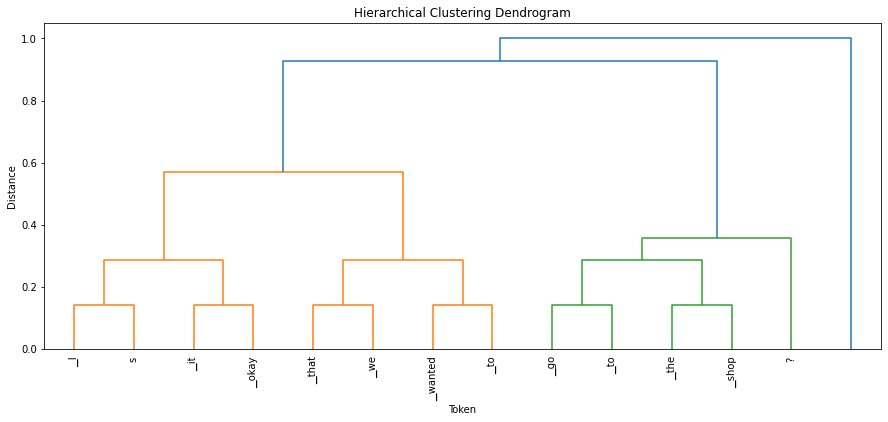

--Test 2--
Input:  ['On Wednesdays I run because I like the feel of it.']


  0%|          | 0/182 [00:00<?, ?it/s]

Partition explainer: 2it [00:14, 14.06s/it]                                                


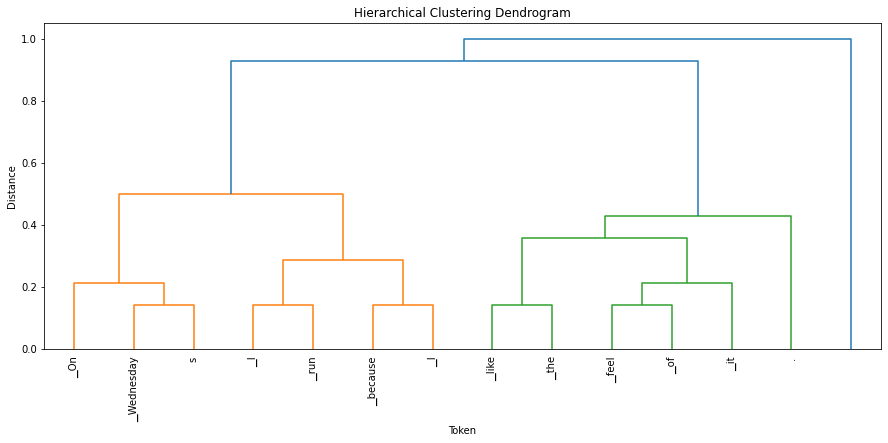

--Test 3--
Input:  ["It's a pity that I couldn't have cycled with them."]


  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 2it [00:13, 13.16s/it]                                                


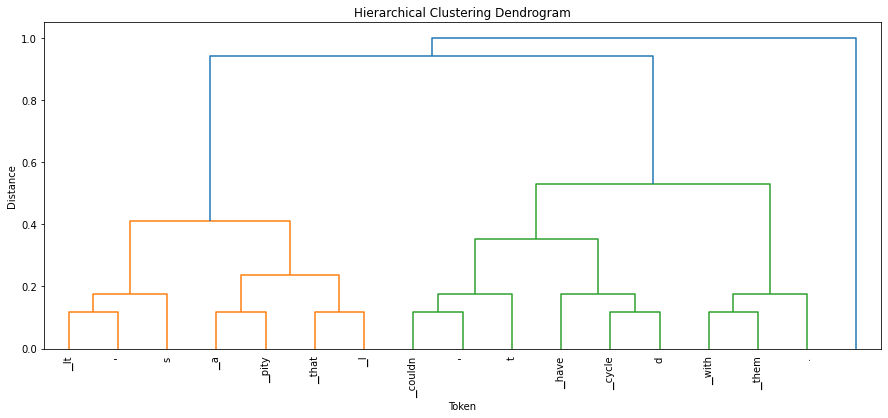

In [121]:
"""
Wraps the Marian Tokenizer within a SHAP Partition Tokenizer.
This allows it to have a clustering method!
"""
exp_partition = shap.Explainer(
        model=model.get(), \
        masker=model.get_tokenizer(),
        algorithm="partition")

def plot_dendrogram(clustering, features):
    plt.figure(figsize=(15,6))
    plt.title("Hierarchical Clustering Dendrogram")
    plt.xlabel("Token")
    plt.ylabel("Distance")
    sp.cluster.hierarchy.dendrogram(
        clustering,
        leaf_rotation=90.,
        leaf_font_size=10,
        labels=features
    )
    plt.show()
    

for i, sentence in enumerate(test_sentences):
    print("--Test {}--".format(i+1))
    print("Input: ", sentence)
    values_partition = exp_partition(sentence)
    
    clustering = values_partition.clustering[0]
    feature_names = values_partition.feature_names[0]
    plot_dendrogram(clustering, feature_names)
    
    shap.plots.text(values_partition)